### Setup Environment:

In [1]:
# Path to main dir eq: %cd ..
%cd ..
#%cd /home/datascience/DF-DM/

/home/datascience/DF-DM


In [2]:
from src.embeddings import load_image_text_embeddings, train_and_evaluate_model

# Class weights
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Models
# Random forest
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
# Logistic regression
from sklearn.linear_model import LogisticRegression
# Support vector machine
from sklearn.svm import SVC
# Decision tree
from sklearn.tree import DecisionTreeClassifier

/home/datascience/conda/data_fusion_v0_0_1/lib/python3.8/site-packages/huggingface_hub/utils/_runtime.py:184: UserWarning: Pydantic is installed but cannot be imported. Please check your installation. `huggingface_hub` will default to not using Pydantic. Error message: '{e}'
  warnings.warn(
2024-03-03 16:18:02.232814: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-03 16:18:02.292150: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-03 16:18:03.454505: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Evaluate the Embeddings

In [3]:
def run_experiments(PATH, LABEL, CLASS_WEIGTHS, MODALITY=None):
    
    # Get the dataset
    X_train, y_train, X_test, y_test = load_image_text_embeddings(path=PATH, label=LABEL, modality=MODALITY)

    # Define a list of models to test
    if CLASS_WEIGTHS:
        class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
        # Create a dictionary from class labels and weights
        class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
        print(f'Setting class weigths to: {class_weights}')

        models = [
            #("SVM", SVC(class_weight=class_weights, probability=True)),
            ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
            #("Decision Tree", DecisionTreeClassifier(class_weight=class_weights)),
            #("Random Forest", RandomForestClassifier(class_weight=class_weights)),
            #("Gradient Boosting", GradientBoostingClassifier()),  
            #("K-Nearest Neighbors", KNeighborsClassifier())
        ]
    else:
        models = [
            #("SVM", SVC(probability=True)),
            ("Logistic Regression", LogisticRegression())
            #('Decision Tree', DecisionTreeClassifier()),
        ]

    # Run the experiments
    train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

#### Constants

In [4]:
# Constants:
PATH = '/home/datascience/DF-DM/Embeddings_c/mimic/embeddings.csv'
CLASS_WEIGTHS = True
MODALITY='image'

### Race

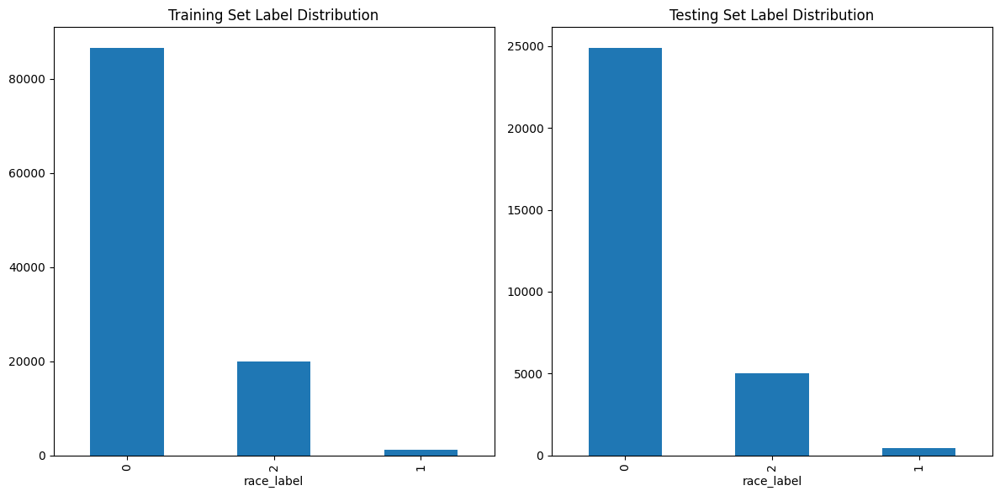

Setting class weigths to: {0: 0.41448254628026016, 1: 31.188821314798727, 2: 1.8008595030266545}


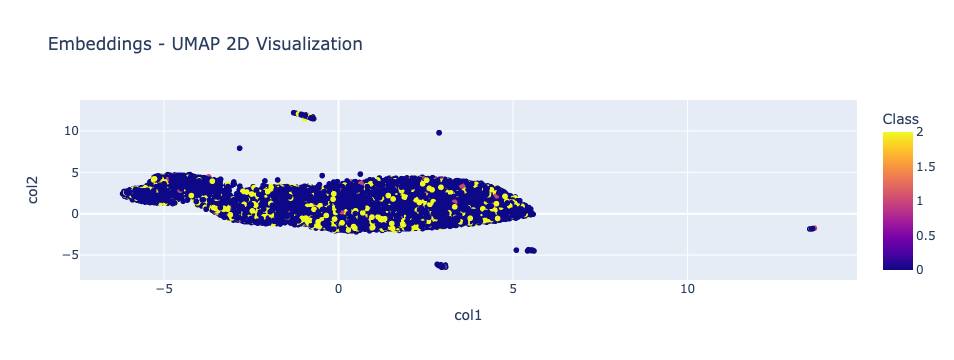

####################  Logistic Regression  ####################


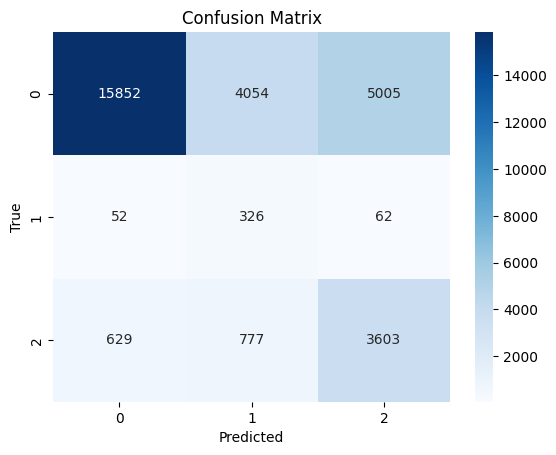

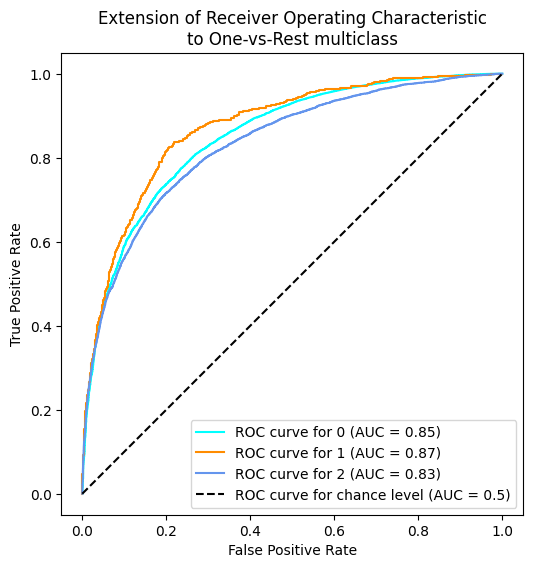

              precision    recall  f1-score   support

           0       0.96      0.64      0.76     24911
           1       0.06      0.74      0.12       440
           2       0.42      0.72      0.53      5009

    accuracy                           0.65     30360
   macro avg       0.48      0.70      0.47     30360
weighted avg       0.86      0.65      0.72     30360



In [5]:
LABEL = 'race_label'

run_experiments(PATH, LABEL, CLASS_WEIGTHS, MODALITY)

### Disease

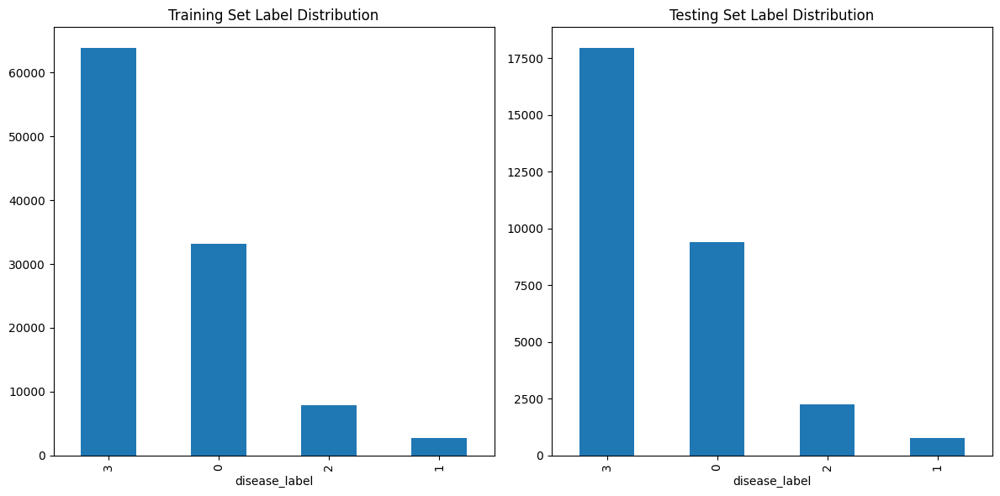

Setting class weigths to: {0: 0.8105412890989554, 1: 10.049925345278089, 2: 3.4249777382012465, 3: 0.4210915261659733}


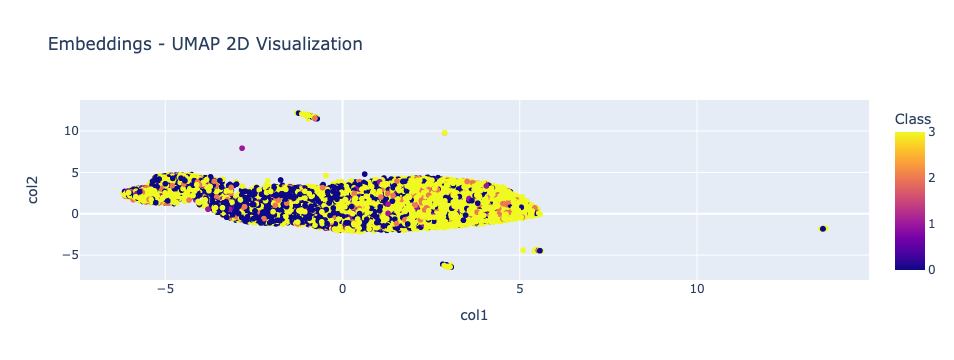

####################  Logistic Regression  ####################


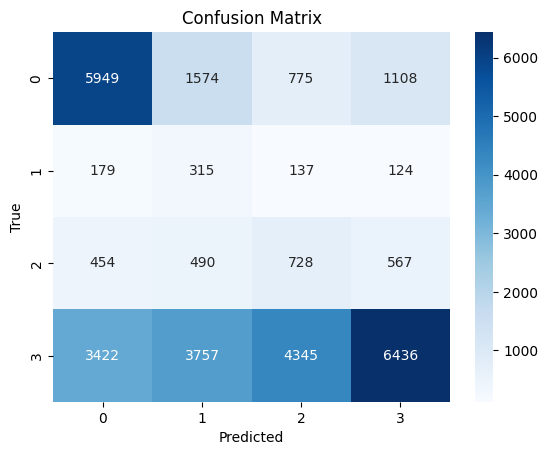

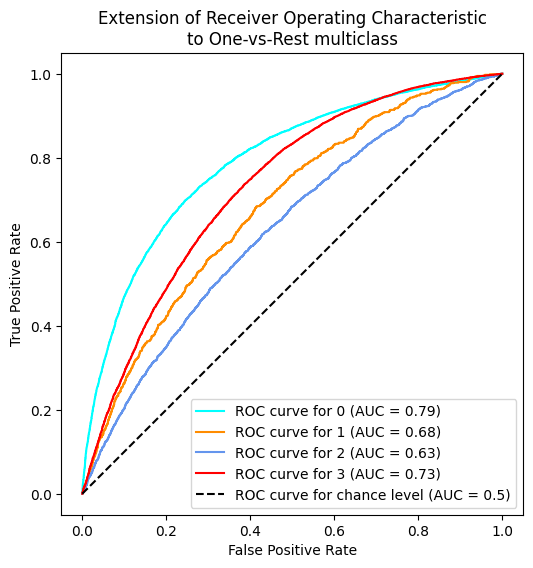

              precision    recall  f1-score   support

           0       0.59      0.63      0.61      9406
           1       0.05      0.42      0.09       755
           2       0.12      0.33      0.18      2239
           3       0.78      0.36      0.49     17960

    accuracy                           0.44     30360
   macro avg       0.39      0.43      0.34     30360
weighted avg       0.66      0.44      0.50     30360



In [6]:
LABEL = 'disease_label'

run_experiments(PATH, LABEL, CLASS_WEIGTHS, MODALITY)

### Sex

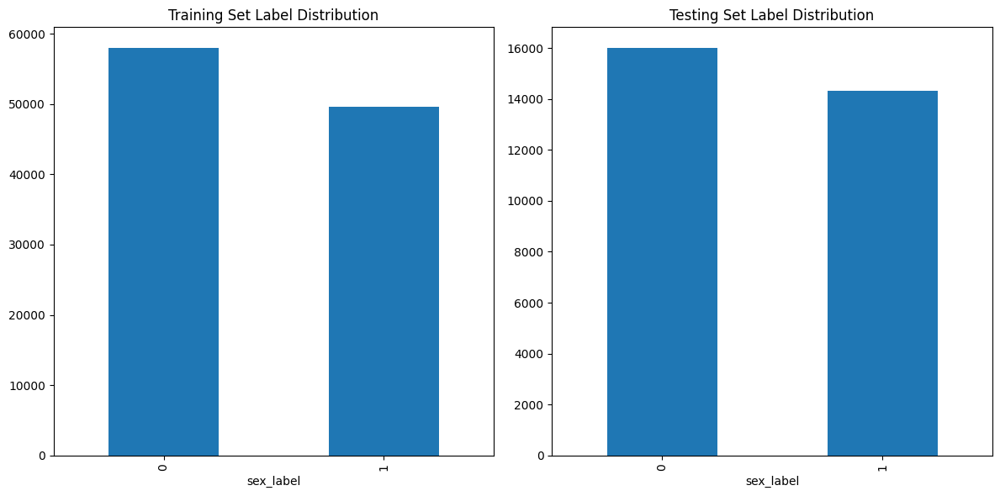

Setting class weigths to: {0: 0.9277333654939527, 1: 1.0844762652810505}


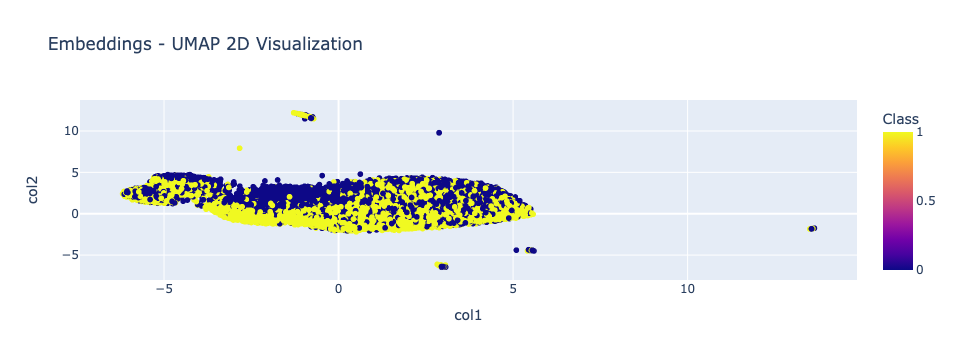

####################  Logistic Regression  ####################


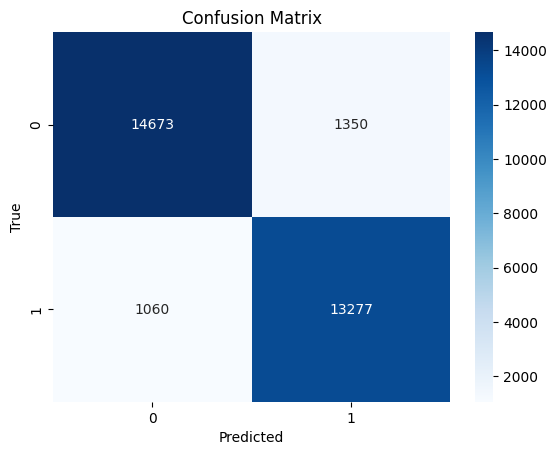

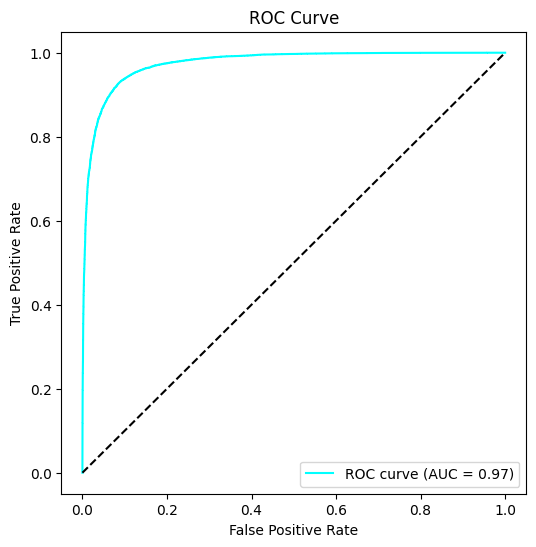

              precision    recall  f1-score   support

           0       0.93      0.92      0.92     16023
           1       0.91      0.93      0.92     14337

    accuracy                           0.92     30360
   macro avg       0.92      0.92      0.92     30360
weighted avg       0.92      0.92      0.92     30360



In [7]:
LABEL = 'sex_label'

run_experiments(PATH, LABEL, CLASS_WEIGTHS, MODALITY)